In [36]:
import yfinance as yf
import pandas as pd
import numpy as np
from pymongo import MongoClient
import datetime
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from talib import abstract

from functools import partial

In [58]:
#Download Data from yahoo
### TEST Scnarios - TCS- Bull ,ACC- modrate up (Sidewase),YESBank- Back to Zero ,ITC(stock dosnt even Move)
stock='TCS'
startdate='2007-01-01'
enddate='2022-01-01'
exchange=['.NS','.BO']
dfo = yf.download(stock+exchange[0],start=startdate)

[*********************100%***********************]  1 of 1 completed


In [59]:
dfo.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2007-01-02,307.350006,314.500000,304.000000,312.125000,236.518219,1545060
2007-01-03,313.250000,322.000000,309.787506,320.037506,242.514023,4384972
2007-01-04,321.250000,321.250000,312.524994,314.762512,238.516708,3970700
2007-01-05,316.250000,317.149994,313.274994,315.750000,239.265106,2718740
2007-01-08,314.750000,314.750000,303.750000,310.950012,235.627853,4951892


## Note that if α=1, the SES model is equivalent to a random walk model (without growth). If α=0, the SES model is equivalent to the mean model, assuming that the first smoothed value is set equal to the mean.

In [217]:
def hla(df,days):
    for day in days:
        df[f'{day}High']=df['High'].rolling(day).max()
        df[f'{day}Low']=df['Low'].rolling(day).min()
        df[f'{day}Avg']=((df['High']+df['Close'])/2).rolling(day).mean()
        df[f'{day}%High']=(df[f'{day}High']/df[f'{day}Avg']-1)
        df[f'{day}%Low']=(df[f'{day}Low']/df[f'{day}Avg']-1)
        
    return df

In [229]:
# ## Making Copy of Dataframe for further analysis and changes
# df=dfo.copy()
# # Adding feild called % Daily changes out of 100%
# df['pct_change']=(df['Close'].pct_change())*100
# df.dropna(inplace=True)


# days=[5,10,21,42,63,84,105,126,189,252]
# df4=hla(df,days)
# df4.dropna(inplace=True)

In [228]:
# fig = make_subplots(rows=2, cols=1,shared_xaxes=True)
# trace1 = go.Scatter(x=df4.index,y=df4['Close'],name='Close',mode='lines',opacity=0.9)
# trace2 = go.Bar(x=df4.index,y=df4['252%High'],name='252High',opacity=0.5)
# trace3 = go.Bar(x=df4.index,y=df4['252%Low'],name='252Low',opacity=0.5)
# trace4 = go.Bar(x=df4.index,y=df4['63%High'],name='63High',opacity=0.8)
# trace5 = go.Bar(x=df4.index,y=df4['63%Low'],name='63Low',opacity=0.8)
# trace6 = go.Scatter(x=df4.index,y=df4['252High'],name='High',mode='lines',opacity=0.9)
# trace7 = go.Scatter(x=df4.index,y=df4['252Low'],name='Low',mode='lines',opacity=0.5)
# trace8 = go.Scatter(x=df4.index,y=df4['63Low'],name='Low',mode='lines',opacity=0.9)
# fig.append_trace(trace1, 1, 1)
# fig.append_trace(trace2, 2, 1)
# fig.append_trace(trace3, 2, 1)
# fig.append_trace(trace4, 2, 1)
# fig.append_trace(trace5, 2, 1)
# fig.append_trace(trace6, 1, 1)
# fig.append_trace(trace7, 1, 1)
# fig.append_trace(trace8, 1, 1)

# fig.update_traces(dict(marker_line_width=0))
# fig.update_layout(autosize=False,width=1200,height=800,paper_bgcolor="white",barmode='overlay',activeshape_opacity=0.5)
# fig.show()

In [74]:
#
def rwema(windows,df1,field):
    for window in windows:
        alpha=1/window
        weights=list(reversed([(1)**n for n in range(window)]))
        weights_T=list(reversed([(1-alpha)**n for n in range(window)]))
        ewma = partial(np.average, weights=weights)
        ewma_T = partial(np.average, weights=weights_T)
        df1[f'{window}RWEMA{field}'] = df1[field].rolling(window).apply(ewma)
        df1[f'{window}RWEMA_T{field}'] = df1[field].rolling(window).apply(ewma_T)
        df1[f'{window}rma_a_dis{field}']=((df1[f'{window}RWEMA_T{field}']/df1[f'{window}RWEMA{field}'])-1)*100
    return df1

In [139]:
def wad(df):
    # TRH = Yesterday's close or today's high, whichever is greater
    # TRL = Yesterday's close or today's low, whichever is less.
    df['TRH']=np.where(df['High']>df['Close'].shift(1),df['High'],df['Close'].shift(1))
    df['TRL']=np.where(df['Low']<df['Close'].shift(1),df['Low'],df['Close'].shift(1))
    # If today's close is greater than yesterday's close:
    # Today's A/D = today's close - TRL
    # If today's close is less than yesterday's close:
    # Today's A/D = today's close - TRH
    # If today's close is equal to yesterday's close:
    # Today's A/D = 0
    #The Williams' Accumulation/Distribution indicator is a cummulative total of these daily values.
    #Williams' A/D = Today's A/D + Yesterday's Williams' A/D

    conditions=[(df['Close']>df['Close'].shift(1)),
                (df['Close']<df['Close'].shift(1)),
                (df['Close']==df['Close'].shift(1))]
    values=[(df['Close']-df['TRL']),(df['Close']-df['TRH']),(0)]
    df['tad']=np.select(conditions,values)
    df['wad']=df['tad'].cumsum()
    df.drop('TRH',axis=1,inplace=True)
    df.drop('TRL',axis=1,inplace=True)
    df.drop('tad',axis=1,inplace=True)
    df.replace(to_replace=np.nan,value=0,inplace=True)
    df['wad']=df['wad']+abs(df['wad'].min())*2
    return df

In [81]:
#
def ma(windows,df1,field):
    for window in windows:
        df1[str(window)+field] = df1[field].rolling(window).mean()
    
    return df1

In [82]:
def madisparity(window,df2,field):
    for window in windows:
        df2[str(window)+field+'DI']=((df2[field]-df2[field].rolling(window).mean())/df2[field].rolling(window).mean())*100
        # df.replace(to_replace=np.nan,method='bfill',inplace=True)

    return df2

In [140]:
## Making Copy of Dataframe for further analysis and changes
df=dfo.copy()
# Adding feild called % Daily changes out of 100%
df['pct_change']=(df['Close'].pct_change())*100
df.dropna(inplace=True)
df=wad(df)

windows=[378,252,189,126,105,84,63,42,21,10]
df0=rwema(windows,df,'Close')
df0=rwema(windows,df,'wad')
df0.dropna(inplace=True)

In [141]:
df0.head()

,Open,High,Low,Close,Adj Close,Volume,pct_change,wad,378RWEMAClose,378RWEMA_TClose,...,63rma_a_diswad,42RWEMAwad,42RWEMA_Twad,42rma_a_diswad,21RWEMAwad,21RWEMA_Twad,21rma_a_diswad,10RWEMAwad,10RWEMA_Twad,10rma_a_diswad
Date,,,,,,,,,,,,,,,,,,,,,
2008-07-10,217.500000,222.250000,213.087494,217.100006,167.846954,3504368,-0.952378,740.924988,266.329895,256.696674,...,-0.372600,764.827373,759.609625,-0.682213,747.523787,745.671245,-0.247824,741.672478,741.191956,-0.064789
2008-07-11,229.250000,235.750000,196.350006,199.649994,154.355835,5523784,-8.037776,704.824982,266.011409,256.360793,...,-0.450206,763.372313,757.474414,-0.772611,745.293429,742.477358,-0.377847,737.228729,735.176342,-0.278392
2008-07-14,200.000000,200.000000,190.250000,191.962494,148.412415,4559896,-3.850488,696.787476,265.686542,256.001758,...,-0.529740,761.249693,754.817507,-0.844951,742.327953,738.641214,-0.496646,732.476230,728.793253,-0.502812
2008-07-15,191.962494,196.612503,184.287506,187.662506,145.087936,4509844,-2.240015,687.837479,265.347686,255.624173,...,-0.613762,758.767252,751.805312,-0.917533,738.846405,734.272593,-0.619048,727.436230,721.999562,-0.747374
2008-07-16,188.662506,193.412506,178.975006,182.024994,140.729355,5739900,-3.004070,676.449966,265.006614,255.231386,...,-0.687598,756.090763,748.482907,-1.006209,734.628547,729.157462,-0.744742,720.344980,713.648373,-0.929639


In [142]:
## Making Copy of Dataframe for further analysis and changes
df=dfo.copy()
# Adding feild called % Daily changes out of 100%
df['pct_change']=(df['Close'].pct_change())*100
df.dropna(inplace=True)
df=wad(df)

windows=[378,252,189,126,105,84,63,42,21,10]
df1=ma(windows,df,'Close')
df1=ma(windows,df,'wad')
df1.dropna(inplace=True)


In [143]:
df1.head()

,Open,High,Low,Close,Adj Close,Volume,pct_change,wad,378Close,252Close,...,378wad,252wad,189wad,126wad,105wad,84wad,63wad,42wad,21wad,10wad
Date,,,,,,,,,,,,,,,,,,,,,
2008-07-10,217.500000,222.250000,213.087494,217.100006,167.846954,3504368,-0.952378,740.924988,266.329895,244.895635,...,880.499058,807.801891,782.350553,758.280636,757.048203,759.740469,765.565667,764.827373,747.523787,741.672478
2008-07-11,229.250000,235.750000,196.350006,199.649994,154.355835,5523784,-8.037776,704.824982,266.011409,244.520486,...,879.541518,806.885274,781.486929,757.531033,756.631417,759.380498,764.794040,763.372313,745.293429,737.228729
2008-07-14,200.000000,200.000000,190.250000,191.962494,148.412415,4559896,-3.850488,696.787476,265.686542,244.108482,...,878.579879,805.921732,780.554786,756.700875,756.202489,758.985409,763.802373,761.249693,742.327953,732.476230
2008-07-15,191.962494,196.612503,184.287506,187.662506,145.087936,4509844,-2.240015,687.837479,265.347686,243.713393,...,877.588014,804.958488,779.534879,755.854942,755.642251,758.532879,762.610111,758.767252,738.846405,727.436230
2008-07-16,188.662506,193.412506,178.975006,182.024994,140.729355,5739900,-3.004070,676.449966,265.006614,243.282391,...,876.578722,803.921733,778.538583,754.771014,754.864037,757.905200,760.865071,756.090763,734.628547,720.344980


In [144]:
## Making Copy of Dataframe for further analysis and changes
df=dfo.copy()
# Adding feild called % Daily changes out of 100%
df['pct_change']=(df['Close'].pct_change())*100
df.dropna(inplace=True)
df=wad(df)

windows=[378,252,189,126,105,84,63,42,21,10]
df2=madisparity(windows,df,'Close')
df2=madisparity(windows,df,'wad')
df2.dropna(inplace=True)

In [145]:
df2.head()

,Open,High,Low,Close,Adj Close,Volume,pct_change,wad,378CloseDI,252CloseDI,...,378wadDI,252wadDI,189wadDI,126wadDI,105wadDI,84wadDI,63wadDI,42wadDI,21wadDI,10wadDI
Date,,,,,,,,,,,,,,,,,,,,,
2008-07-10,217.500000,222.250000,213.087494,217.100006,167.846954,3504368,-0.952378,740.924988,-18.484552,-11.349990,...,-15.851700,-8.278874,-5.295013,-2.288816,-2.129747,-2.476567,-3.218624,-3.125200,-0.882754,-0.100784
2008-07-11,229.250000,235.750000,196.350006,199.649994,154.355835,5523784,-8.037776,704.824982,-24.946831,-18.350402,...,-19.864501,-12.648675,-9.809754,-6.957610,-6.846984,-7.184214,-7.841204,-7.669564,-5.429868,-4.395345
2008-07-14,200.000000,200.000000,190.250000,191.962494,148.412415,4559896,-3.850488,696.787476,-27.748507,-21.361809,...,-20.691619,-13.541545,-10.731766,-7.917712,-7.857024,-8.194879,-8.773853,-8.467947,-6.134819,-4.872343
2008-07-15,191.962494,196.612503,184.287506,187.662506,145.087936,4509844,-2.240015,687.837479,-29.276750,-22.998690,...,-21.621824,-14.549944,-11.763091,-8.998746,-8.973131,-9.320018,-9.804831,-9.348028,-6.903861,-5.443605
2008-07-16,188.662506,193.412506,178.975006,182.024994,140.729355,5739900,-3.004070,676.449966,-31.313037,-25.179544,...,-22.830665,-15.856241,-13.112853,-10.376796,-10.387840,-10.747417,-11.094622,-10.533232,-7.919455,-6.093610


In [34]:
# df0['UMA']=(df1[f'{windows[0]}RWEMA']+df1[f'{windows[1]}RWEMA']+df1[f'{windows[2]}RWEMA']+df1[f'{windows[3]}RWEMA']+df1[f'{windows[4]}RWEMA']+df1[f'{windows[5]}RWEMA']+df1[f'{windows[6]}RWEMA']+df1[f'{windows[7]}RWEMA']+df1[f'{windows[8]}RWEMA']+df1[f'{windows[9]}RWEMA'])/10
# df1['UMA']=(df2[f'{windows[0]}Close']+df2[f'{windows[1]}Close']+df2[f'{windows[2]}Close']+df2[f'{windows[3]}Close']+df2[f'{windows[4]}Close']+df2[f'{windows[5]}Close']+df2[f'{windows[6]}Close']+df2[f'{windows[7]}Close']+df2[f'{windows[8]}Close']+df2[f'{windows[9]}Close'])/10

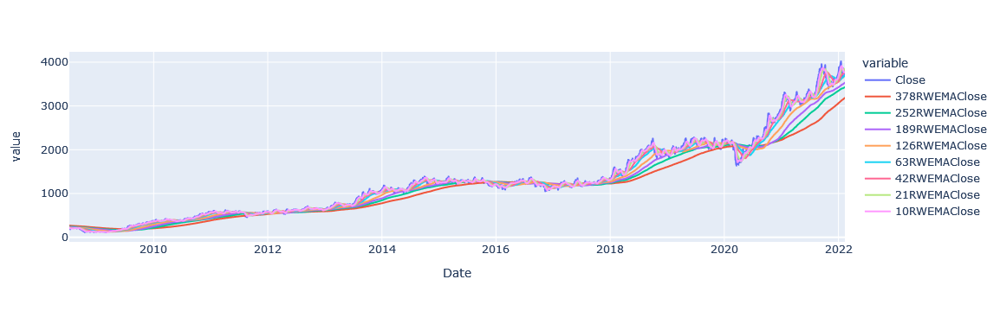

In [146]:
fig=px.line(df0[['Close','378RWEMAClose','252RWEMAClose','189RWEMAClose','126RWEMAClose','63RWEMAClose','42RWEMAClose','21RWEMAClose','10RWEMAClose']])
fig.show()

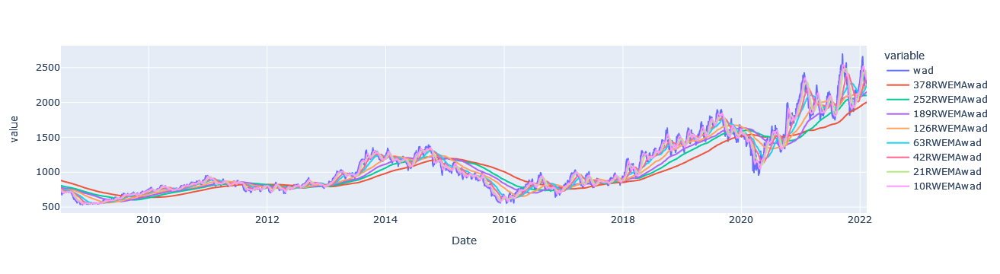

In [147]:
fig=px.line(df0[['wad','378RWEMAwad','252RWEMAwad','189RWEMAwad','126RWEMAwad','63RWEMAwad','42RWEMAwad','21RWEMAwad','10RWEMAwad']])
fig.show()

In [148]:
df1['UMA']=(df1[f'{windows[0]}Close']+df1[f'{windows[1]}Close']+df1[f'{windows[2]}Close']+df1[f'{windows[3]}Close']+df1[f'{windows[4]}Close']+df1[f'{windows[5]}Close']+df1[f'{windows[6]}Close']+df1[f'{windows[7]}Close']+df1[f'{windows[8]}Close']+df1[f'{windows[9]}Close'])/10
df1['uwad']=(df1[f'{windows[0]}wad']+df1[f'{windows[1]}wad']+df1[f'{windows[2]}wad']+df1[f'{windows[3]}wad']+df1[f'{windows[4]}wad']+df1[f'{windows[5]}wad']+df1[f'{windows[6]}wad']+df1[f'{windows[7]}wad']+df1[f'{windows[8]}wad']+df1[f'{windows[9]}wad'])/10

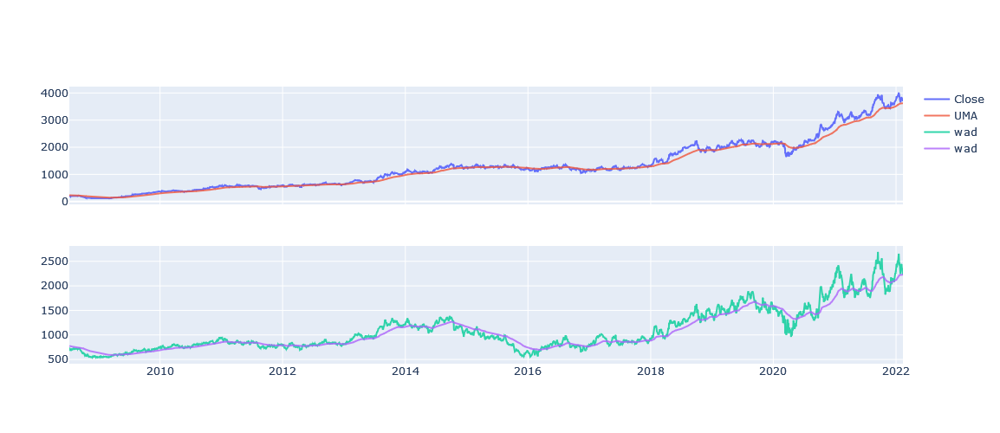

In [149]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True)
trace0 = go.Scatter(x=df1.index,y=df1['Close'],mode='lines',name='Close')
trace1 = go.Scatter(x=df1.index,y=df1['UMA'],name='UMA',opacity=0.8)
trace2 = go.Scatter(x=df2.index,y=df1['wad'],name='wad',opacity=0.8)
trace3 = go.Scatter(x=df2.index,y=df1['uwad'],name='wad',opacity=0.8)
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 2, 1)
fig.update_traces(dict(marker_line_width=0))
fig.update_layout(autosize=False,width=1200,height=500,paper_bgcolor="white",barmode='overlay',activeshape_opacity=0.5)
fig.show()


In [167]:
#[378,252,189,126,105,84,63,42,21,10]
#df2['UMA']=(df2[f'{windows[0]}CloseDI']+df2[f'{windows[1]}CloseDI']+df2[f'{windows[2]}CloseDI']+df2[f'{windows[3]}CloseDI']+df2[f'{windows[4]}CloseDI']+df2[f'{windows[5]}CloseDI']+df2[f'{windows[6]}CloseDI']+df2[f'{windows[7]}CloseDI']+df2[f'{windows[8]}CloseDI']+df2[f'{windows[9]}CloseDI'])/10
#df2['uwad']=(df2[f'{windows[0]}wadDI']+df2[f'{windows[1]}wadDI']+df2[f'{windows[2]}wadDI']+df2[f'{windows[3]}wadDI']+df2[f'{windows[4]}wadDI']+df2[f'{windows[5]}wadDI']+df2[f'{windows[6]}wadDI']+df2[f'{windows[7]}wadDI']+df2[f'{windows[8]}wadDI']+df2[f'{windows[9]}wadDI'])/10
df2['UMA']=(df2[f'{windows[1]}CloseDI'])
df2['uwad']=(df2[f'{windows[1]}wadDI'])

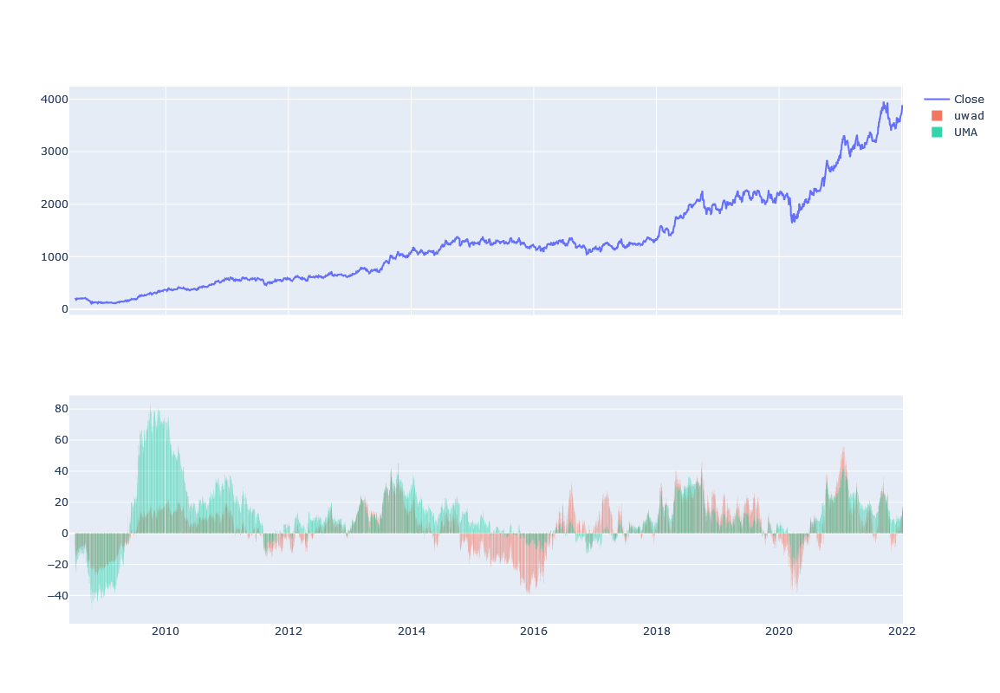

In [168]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True)
trace0 = go.Scatter(x=df2.index,y=df2['Close'],mode='lines',name='Close')
trace1 = go.Bar(x=df2.index,y=df2['UMA'],name='UMA',opacity=0.8)
trace2 = go.Bar(x=df2.index,y=df2['uwad'],name='uwad',opacity=0.8)

fig.append_trace(trace0, 1, 1)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace1, 2, 1)


fig.update_traces(dict(marker_line_width=0))
fig.update_layout(autosize=False,width=1200,height=800,paper_bgcolor="white",barmode='overlay',activeshape_opacity=0.5)
fig.show()


In [14]:
def mov(bins,df,field):
    temp=bins
    #temp=[-500,-400,-300,-200,-100,-50,-30,-20,-15,-10,-5,-2,-1,0,1,2,5,10,15,20,30,50,100,200,300,400,500]
    len(temp) #--13
    range(len(temp)) #--(0,13)
    temp.index(0) #-- Zero at 6th Index
    neg={}
    pos={}


    for i in range(0,temp.index(0)):
        # print(i+1+temp.index(0),temp.index(0)-1-i)
        # print(f" Searching from {temp[temp.index(0)]} to {temp[temp.index(0)-1-i]}")
        tempcountneg=df[field].loc[(df[field]>temp[temp.index(0)-1-i])&(df[field]<temp[temp.index(0)])].count()
        neg[f"{temp[temp.index(0)]} - {temp[temp.index(0)-1-i]}"]=tempcountneg
        # neglist.append(tempcountneg*-1)

        # print(f" Searching from {temp[temp.index(0)]} to {temp[i+1+temp.index(0)]}")
        tempcountpos=df[field].loc[(df[field]<temp[i+1+temp.index(0)])&(df[field]>temp[temp.index(0)])].count()
        pos[f"{temp[temp.index(0)]} - {temp[i+1+temp.index(0)]}"]=tempcountpos
        # poslist.append(tempcountpos)
    negdf=pd.DataFrame(neg,index=[0])
    posdf=pd.DataFrame(pos,index=[0]) 

    ## .iloc[::-1] to reverse the Dataframe
    # negdf=negdf.T.iloc[::-1]
    negdf=negdf.T
    posdf=posdf.T

    #######Setting the coulmns
    negdf.reset_index(inplace=True)
    negdf.columns=['Range','Total']
    negdf.set_index('Range',inplace=True)

    posdf.reset_index(inplace=True)
    posdf.columns=['Range','Total']
    posdf.set_index('Range',inplace=True)

    ######Calculating total change between days
    negdf['Diff']=abs(negdf['Total']-negdf['Total'].shift(1))
    negdf.replace(to_replace=np.nan,value=0,inplace=True)
    negdf['%Reach']=abs((negdf['Diff']/negdf['Total'][temp.index(0)-1])*100)
    # print(negdf['Total'][temp.index(0)-1])


    posdf['Diff']=abs(posdf['Total']-posdf['Total'].shift(1))
    posdf.replace(to_replace=np.nan,value=0,inplace=True)
    posdf['%Reach']=abs((posdf['Diff']/posdf['Total'][temp.index(0)-1])*100)
    # print(posdf['Total'][temp.index(0)-1])

    ######Reversing the datatable
    negdf=negdf.iloc[::-1]

    newdf=negdf.append(posdf)
    return newdf

    # df['RWEMA_252_movement'].loc[(df['RWEMA_252_movement']>-15)&(df['RWEMA_252_movement']<0)].count()

In [195]:
def backtester(start,end,init_df,trade_type,ma):
    bt=pd.DataFrame({'StartDate':start,'EndDate':end})
    bt.replace(to_replace=np.nan,value=0,inplace=True)
    
    dataframes=[]
    pc_=[]
    
    if trade_type=='long':
        
        for index in bt.index:
            init_df_tmp=(init_df.loc[(init_df.index>=bt['StartDate'][index]) & (init_df.index<=bt['EndDate'][index])]).copy()
            ## Setting up Default Variables
            pos=0
            num=0
            percentchange=[]
            day_count=0
            init_df_tmp['pos_days']=0
            init_df_tmp['s_daily_change']=0.0
            init_df_tmp['u_daily_Return']=0.0
            s_st=[]
            trigger_p=[]
            lastpc=[0,]
            
            s_start=0
            #### price at time of start date of this stratgy
            u_st=init_df_tmp['Close'][0]
            
            for i in init_df_tmp.index:
                CP=init_df_tmp['Close'][i]
                # Underline Daily return from the start date of Stratgy
                if s_start!=0:
                    init_df_tmp.at[i,'u_daily_Return']=init_df_tmp['pct_change'][i]
                
                if i != init_df_tmp.index[9]:##############3 Passing first 10 Days

                    #############Conditions######################
                    #############Long Position###################
                    long_condition=((init_df_tmp['UMA'][i]> 5)) & ((init_df_tmp['buwad'][i]>0) &(init_df_tmp['buwad'].shift(1)[i]< 0))         
                    #############Long SL/Exit#########################
                    long_exit= ((init_df_tmp['uwad'][i] < 0) & (init_df_tmp['uwad'].shift(1)[i] > 0))|((init_df_tmp['UMA'][i] < 0) & (init_df_tmp['UMA'].shift(1)[i] > 0))
                    
                    #############Short SL/Exit#########################
                
                  
                    
                    ## Enter into Long
                    if not s_st:
                        if long_condition:                
                            if(pos==0):
                                print(f"Long Buy Triggred")
                                s_start=1
                                bp=CP
                                pos=1
                                print(f"Buying now at {str(bp)} on {i}")
                                init_df_tmp.at[i,'pos_days']=day_count
                                if not s_st: # to check if any long or short position already triggred or not. if s_st have value ,means already atleast one trade happned.
                                    s_st.append(bp)
                    if s_st:
                        if(pos==1):
                            day_count+=1
                            init_df_tmp.at[i,'pos_days']=day_count
                            init_df_tmp.at[i,'s_daily_change']=init_df_tmp['pct_change'][i]

                    ## Long SL/Exit       
                        if long_exit:                
                            if(pos==1):
                                print("Long Covering Triggred")
                                day_count=0
                                pos=0
                                sp=CP
                                print(f"Existing now at {str(sp)} on {i}")
                                pc=(sp/bp-1)*100
                                percentchange.append(pc)
                                init_df_tmp.at[i,'pos_days']=day_count
                                s_st.clear()


                        if(num==init_df_tmp["Close"].count()-1 and pos==1):
                            pos=0
                            sp=CP
                            day_count=0
                            print(f"Existing now at {str(sp)} on {i}")
                            pc=(sp/bp-1)*100
                            percentchange.append(pc)
                            init_df_tmp.at[i,'pos_days']=day_count
                            s_st.clear()


                num+=1    
                pc_.append(percentchange)

                #################################for Performance Matrix############
                # Stratgy Cummulative returns and Underline Cummulative returns
                init_df_tmp['scr']=((1+(init_df_tmp['s_daily_change']/100)).cumprod()-1)*100
                init_df_tmp['ucr']=((1+(init_df_tmp['u_daily_Return']/100)).cumprod()-1)*100        
                
                gains=0
                ng=0
                losses=0
                nl=0
                for i in percentchange:
                    if(i>0):
                        gains+=i
                        ng+=1
                    else:
                        losses+=i
                        nl+=1

                if(ng>0):
                    avgGain=gains/ng
                    maxR=max(percentchange)
                else:
                    avgGain=0
                    maxR=0

                if(nl>0):
                    avgLoss=losses/nl
                    maxL=min(percentchange)
                    ratio=-avgGain/avgLoss
                else:
                    avgLoss=0
                    maxL=0
                    ratio=999

                if(ng>0 or nl>0):
                    battingAvg=(ng/(ng+nl))*100
                else:
                    battingAvg=0
                ### Adding matrix to BackTEST Dataframe#####
                bt.at[index,'MA']=ma
                bt.at[index,'#Trades']=ng+nl
                bt.at[index,'Win avg']=round(battingAvg,2)
                bt.at[index,'#Wins']=ng
                bt.at[index,'#loss']=nl
                bt.at[index,'Gain/loss ratio']=round(ratio,2)
                bt.at[index,'Average Gain %']=round(avgGain,2)
                bt.at[index,'Average Loss %']=round(avgLoss,2)
                bt.at[index,'Max Return %']=round(maxR,2)
                bt.at[index,'Max Loss %']=round(maxL,2)
                bt.at[index,'Stratergy-Cum Total return %']=round(init_df_tmp['scr'][-1],2)
                bt.at[index,'Underline-Cum Total return %']=round(init_df_tmp['ucr'][-1],2)

                ## Adding Result Dataframe into List of Dataframes
                dataframes.append(init_df_tmp)
                
    return bt,dataframes

In [198]:
## Making Copy of Dataframe for further analysis and changes
df=dfo.copy()
# Adding feild called % Daily changes out of 100%
df['pct_change']=(df['Close'].pct_change())*100
df.dropna(inplace=True)
df=wad(df)

windows=[378,252,189,126,105,84,63,42,21,10]
df2=madisparity(windows,df,'Close')
df2=madisparity(windows,df,'wad')
df2.dropna(inplace=True)
#df2['UMA']=(df2[f'{windows[0]}Close']+df2[f'{windows[1]}Close']+df2[f'{windows[2]}Close']+df2[f'{windows[3]}Close']+df2[f'{windows[4]}Close']+df2[f'{windows[5]}Close']+df2[f'{windows[6]}Close']+df2[f'{windows[7]}Close']+df2[f'{windows[8]}Close']+df2[f'{windows[9]}Close'])/10
df2['UMA']=(df2[f'{windows[1]}CloseDI'])
df2['buwad']=df2[f'{windows[1]}wadDI'].rolling(2).mean()
df2['uwad']=df2[f'{windows[1]}wadDI']
start=['2010-01-01']
end=['2020-01-01']
result,result_dataframes=backtester(start=start,end=end,init_df=df2,trade_type='long',ma=200)

Long Buy Triggred
Buying now at 569.2999877929688 on 2011-02-21 00:00:00
Long Covering Triggred
Existing now at 535.4000244140625 on 2011-03-21 00:00:00
Long Buy Triggred
Buying now at 559.8250122070312 on 2011-03-25 00:00:00
Long Covering Triggred
Existing now at 579.3250122070312 on 2011-04-28 00:00:00
Long Buy Triggred
Buying now at 582.4249877929688 on 2011-05-19 00:00:00
Long Covering Triggred
Existing now at 574.9500122070312 on 2011-05-24 00:00:00
Long Buy Triggred
Buying now at 587.7000122070312 on 2011-06-01 00:00:00
Long Covering Triggred
Existing now at 576.0499877929688 on 2011-06-03 00:00:00
Long Buy Triggred
Buying now at 589.6500244140625 on 2011-06-07 00:00:00
Long Covering Triggred
Existing now at 554.5999755859375 on 2011-06-17 00:00:00
Long Buy Triggred
Buying now at 577.0 on 2011-06-28 00:00:00
Long Covering Triggred
Existing now at 572.6749877929688 on 2011-07-12 00:00:00
Long Buy Triggred
Buying now at 573.5750122070312 on 2011-07-27 00:00:00
Long Covering Triggre

In [199]:
result

,StartDate,EndDate,MA,#Trades,Win avg,#Wins,#loss,Gain/loss ratio,Average Gain %,Average Loss %,Max Return %,Max Loss %,Stratergy-Cum Total return %,Underline-Cum Total return %
0,2010-01-01,2020-01-01,200.0,19.0,31.58,6.0,13.0,4.05,12.09,-2.98,52.32,-5.95,61.52,280.75


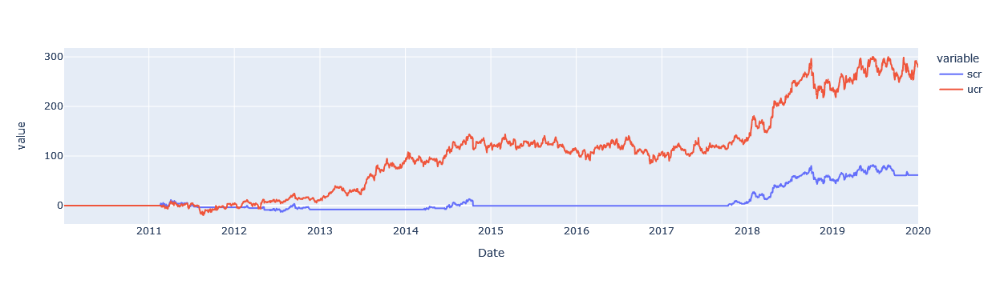

In [200]:
result_df=result_dataframes[0]
fig=px.line(result_df[['scr','ucr']],)
fig.show()

In [19]:
result_df

,Open,High,Low,Close,Adj Close,Volume,pct_change,378Close,252Close,189Close,...,63Close,42Close,21Close,10Close,UMA,pos_days,s_daily_change,u_daily_Return,scr,ucr
Date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,1341.150024,1347.400024,1317.500000,1322.800049,1222.738403,1351760,-2.058339,7.858239,6.898195,5.638639,...,1.110612,-0.356458,1.040919,0.860460,3.255395,0,0.000000,0.000000,0.000000,0.000000
2018-01-02,1330.000000,1334.800049,1310.099976,1315.599976,1216.082886,1920290,-0.544305,7.272797,6.262195,5.021441,...,0.448900,-0.903311,0.488664,0.117955,2.631307,0,0.000000,0.000000,0.000000,0.000000
2018-01-03,1316.000000,1334.500000,1315.599976,1319.324951,1219.526245,1257120,0.283139,7.569022,6.514082,5.272810,...,0.613598,-0.639257,0.761642,0.159994,2.849106,0,0.000000,0.000000,0.000000,0.000000
2018-01-04,1325.000000,1331.000000,1320.000000,1328.550049,1228.053711,913082,0.699229,8.302341,7.208790,5.954021,...,1.177801,0.063082,1.426450,0.600099,3.488358,0,0.000000,0.000000,0.000000,0.000000
2018-01-05,1325.000000,1349.750000,1325.000000,1344.599976,1242.889160,1153706,1.208078,9.584102,8.447030,7.168921,...,2.250208,1.290859,2.547563,1.456273,4.635386,0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-26,2216.399902,2229.000000,2195.199951,2201.949951,2133.431396,1880367,-0.616093,7.429162,5.226492,3.015432,...,4.478188,3.192736,4.267574,1.693543,3.862495,47,-0.616093,-0.616093,4.765556,4.889720
2019-12-27,2208.000000,2226.399902,2176.000000,2198.500000,2130.088135,2720261,-0.156677,7.198389,5.018629,2.813679,...,4.193803,2.935954,3.766810,0.708187,3.546165,48,-0.156677,-0.156677,4.601413,4.725382
2019-12-30,2207.000000,2225.000000,2177.100098,2183.199951,2115.264648,2288830,-0.695931,6.392868,4.249544,2.057661,...,3.394988,2.232868,2.800098,-0.502910,2.734183,49,-0.695931,-0.695931,3.873459,3.996566


In [20]:

result_df.groupby('pos_days')['pos_days'].all()

pos_days
0     False
1      True
2      True
3      True
4      True
5      True
6      True
7      True
8      True
9      True
10     True
11     True
12     True
13     True
14     True
15     True
16     True
17     True
18     True
19     True
20     True
21     True
22     True
23     True
24     True
25     True
26     True
27     True
28     True
29     True
30     True
31     True
32     True
33     True
34     True
35     True
36     True
37     True
38     True
39     True
40     True
41     True
42     True
43     True
44     True
45     True
46     True
47     True
48     True
49     True
50     True
Name: pos_days, dtype: bool

In [21]:
df1

,Open,High,Low,Close,Adj Close,Volume,pct_change,378RWEMA,252RWEMA,189RWEMA,126RWEMA,105RWEMA,84RWEMA,63RWEMA,42RWEMA,21RWEMA,10RWEMA,UMA
Date,,,,,,,,,,,,,,,,,,
2012-02-10,614.000000,619.000000,606.000000,616.700012,509.218384,2324302,0.390693,541.798214,557.673115,554.032011,544.012500,554.051905,564.077678,570.325000,574.314283,565.686904,588.295001,561.426661
2012-02-13,611.099976,618.974976,607.000000,612.849976,506.039398,1631770,-0.624297,542.258333,557.825694,554.258995,544.678174,554.955000,565.036011,571.097221,574.829164,568.929760,593.992499,562.786085
2012-02-14,612.500000,614.775024,607.500000,610.000000,503.686066,1826646,-0.465036,542.728307,558.001984,554.469974,545.529960,555.926190,566.102381,571.855951,575.275593,572.126189,598.372498,564.038903
2012-02-15,613.575012,624.400024,609.750000,620.799988,512.603821,2167166,1.770490,543.206812,558.233135,554.813492,546.628373,557.144762,567.069940,572.842856,576.410116,575.273807,604.017499,565.564079
2012-02-16,619.000000,621.000000,609.000000,612.674988,505.894897,1886660,-1.308795,543.684127,558.485218,555.073413,547.585912,558.247619,567.859225,573.717459,577.382734,578.164283,607.884998,566.808499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-07,3791.000000,3831.800049,3756.149902,3779.000000,3779.000000,1919149,-0.941044,3170.201058,3417.262695,3518.623273,3672.778952,3690.126174,3655.291056,3681.592843,3760.238089,3840.561884,3769.214990,3617.589102
2022-02-08,3791.550049,3799.699951,3721.000000,3743.449951,3743.449951,2946443,-0.940726,3174.152778,3419.405552,3521.853696,3676.220618,3689.436175,3653.511890,3685.366653,3763.611898,3835.321405,3766.424976,3618.530564
2022-02-09,3750.000000,3777.949951,3746.100098,3760.550049,3760.550049,1638721,0.456800,3178.123810,3421.629759,3525.107930,3679.695619,3689.306652,3651.427368,3689.751573,3766.558326,3829.640451,3765.489990,3619.673148


In [22]:
.378.

SyntaxError: invalid syntax (Temp/ipykernel_28500/2537226359.py, line 1)